In [1]:
#Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Model
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split

In [109]:
df = pd.read_csv("kc_house_data.csv")
pd.set_option('display.max_columns', None)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [111]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['quarter'] = df['date'].dt.quarter
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day

In [112]:
df.drop(columns='date', inplace=True)

In [113]:
df.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,4,10,13
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,4,12,9
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,1,2,25
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,4,12,9
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,1,2,18


In [8]:
df.isna().sum()

id               0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
year             0
quarter          0
month            0
day              0
dtype: int64

In [9]:
df.dtypes

id                 int64
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
year               int64
quarter            int64
month              int64
day                int64
dtype: object

In [10]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652,2014.322954,2.524777,6.574423,15.688197
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631,0.467616,1.034210,3.115308,8.635063
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,2014.000000,1.000000,1.000000,1.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000,2014.000000,2.000000,4.000000,8.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000,2014.000000,2.000000,6.000000,16.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,2015.000000,3.000000,9.000000,23.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,2015.000000,4.000000,12.000000,31.000000


In [11]:
dfDesc = []

for i in df.columns:
    dfDesc.append([
        i,
        df[i].dtypes,
        df[i].isna().sum(),
        round((((df[i].isna().sum() )/ len(df)) * 100),2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(data = dfDesc,
            columns = [
                'Features',
                'DataType',
                'Null',
                'NullPercentage',
                'Unique',
                'Unique Sample'
            ])

,Features,DataType,Null,NullPercentage,Unique,Unique Sample
0,id,int64,0,0.0,21436,"[7655900187, 7504000510]"
1,price,float64,0,0.0,4028,"[778100.0, 451555.0]"
2,bedrooms,int64,0,0.0,13,"[7, 6]"
3,bathrooms,float64,0,0.0,30,"[3.0, 5.75]"
4,sqft_living,int64,0,0.0,1038,"[2153, 3400]"
5,sqft_lot,int64,0,0.0,9782,"[15002, 6448]"
6,floors,float64,0,0.0,6,"[2.5, 3.0]"
7,waterfront,int64,0,0.0,2,"[0, 1]"
8,view,int64,0,0.0,5,"[4, 2]"
9,condition,int64,0,0.0,5,"[4, 5]"


In [12]:
Desc_outliers = []
hitung = 0

for i in df:
    Q1 = df.describe()[i]['25%']
    Q3 = df.describe()[i]['75%']
    IQR = Q3 - Q1
    upper_fence = Q3 + (1.5*IQR)
    lower_fence = Q1 - (1.5*IQR)
    
    for j in df[i]:
        if (j < lower_fence) | (j > upper_fence) :
            hitung+=1
    Desc_outliers.append([
        i,
        hitung
    ])

pd.DataFrame(Desc_outliers, columns=[
    "Data Features",
    "Jumlah Outliers"
])

,Data Features,Jumlah Outliers
0,id,0
1,price,1146
2,bedrooms,1692
3,bathrooms,2263
4,sqft_living,2835
5,sqft_lot,5260
6,floors,5260
7,waterfront,5423
8,view,7547
9,condition,7577


# Machine Learning Basic Model

In [13]:
Model1 = LinearRegression()
Model2 = Ridge()
Model3 = Lasso()
Model4 = ElasticNet()

In [14]:
X = df.drop(columns='price')
y = df['price']
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size = .20, random_state = 69)

In [15]:
Model1.fit(Xtrain, ytrain)
Model2.fit(Xtrain, ytrain)
Model3.fit(Xtrain, ytrain)
Model4.fit(Xtrain, ytrain)

C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=6.98054e-24): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 297301832972121.4, tolerance: 219175513178.59964
  model = cd_fast.enet_coordinate_descent(
C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 446319428350831.5, tolerance: 219175513178.59964
  model = cd_fast.enet_coordinate_descent(


ElasticNet()

In [16]:
Model1_ytrain_pred = Model1.predict(Xtrain)
Model2_ytrain_pred = Model2.predict(Xtrain)
Model3_ytrain_pred = Model3.predict(Xtrain)
Model4_ytrain_pred = Model4.predict(Xtrain)

In [17]:
Model1_ytest_pred = Model1.predict(Xtest)
Model2_ytest_pred = Model2.predict(Xtest)
Model3_ytest_pred = Model3.predict(Xtest)
Model4_ytest_pred = Model4.predict(Xtest)

In [18]:
hasilpolos = {
    "Model" : ["LinReg", "Ridge", "Lasso", "Enet"],
    "r2_train" : [r2_score(ytrain, Model1_ytrain_pred), r2_score(ytrain, Model2_ytrain_pred), r2_score(ytrain, Model3_ytrain_pred), r2_score(ytrain, Model4_ytrain_pred)],
    "MAE_train" : [mean_absolute_error(ytrain, Model1_ytrain_pred), mean_absolute_error(ytrain, Model2_ytrain_pred), mean_absolute_error(ytrain, Model3_ytrain_pred), mean_absolute_error(ytrain, Model4_ytrain_pred)],
    "MSE_train" : [mean_squared_error(ytrain, Model1_ytrain_pred), mean_squared_error(ytrain, Model2_ytrain_pred), mean_squared_error(ytrain, Model3_ytrain_pred), mean_squared_error(ytrain, Model4_ytrain_pred)],
    "RMSE_train" : [np.sqrt(mean_squared_error(ytrain, Model1_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model2_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model3_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model4_ytrain_pred))],
    "r2_test" : [r2_score(ytest, Model1_ytest_pred), r2_score(ytest, Model2_ytest_pred), r2_score(ytest, Model3_ytest_pred), r2_score(ytest, Model4_ytest_pred)],
    "MAE_test" : [mean_absolute_error(ytest, Model1_ytest_pred), mean_absolute_error(ytest, Model2_ytest_pred), mean_absolute_error(ytest, Model3_ytest_pred), mean_absolute_error(ytest, Model4_ytest_pred)],
    "MSE_test" : [mean_squared_error(ytest, Model1_ytest_pred), mean_squared_error(ytest, Model2_ytest_pred), mean_squared_error(ytest, Model3_ytest_pred), mean_squared_error(ytest, Model4_ytest_pred)],
    "RMSE_test" : [np.sqrt(mean_squared_error(ytest, Model1_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model2_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model3_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model4_ytest_pred))]
}

In [19]:
df_hasilpolos = pd.DataFrame(data = hasilpolos).sort_values(by=['r2_train', "r2_test"], ascending=False)
df_hasilpolos

,Model,r2_train,MAE_train,MSE_train,RMSE_train,r2_test,MAE_test,MSE_test,RMSE_test
0,LinReg,0.702226,123358.602004,3.774718e+10,194286.335541,0.696239,126403.733733,5.066831e+10,225096.224442
2,Lasso,0.702226,123357.530222,3.774718e+10,194286.336442,0.696239,126402.506519,5.066833e+10,225096.270108
1,Ridge,0.702223,123339.599160,3.774745e+10,194287.035097,0.696238,126382.802053,5.066846e+10,225096.561337
3,Enet,0.617806,142860.230726,4.844861e+10,220110.439874,0.623505,147230.741397,6.280069e+10,250600.649936


#### Berdasarkan Evaluation Matrix untuk keempat model dasar, model terbaik menggunakan Linear Regression, kemudian Lasso, Ridge, dan terakhir ElasticNet

# Drop Outliers

In [20]:
kurang = []
Q1 = df.describe()['price']['25%']
Q3 = df.describe()['price']['75%']
IQR = Q3 - Q1
upper_fence = Q3 + (1.5*IQR)
lower_fence = Q1 - (1.5*IQR)
for i in range(len(df)):
    if (df.iloc[i,1] < lower_fence) | (df.iloc[i,1] > upper_fence) :
        kurang.append(i)

len(kurang)

1146

In [21]:
df1 = df.copy(deep=True)
df1.drop(kurang, inplace=True)

In [22]:
X = df1.drop(columns='price')
y = df1['price']
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size = .20, random_state = 69)

In [23]:
Model1.fit(Xtrain, ytrain)
Model2.fit(Xtrain, ytrain)
Model3.fit(Xtrain, ytrain)
Model4.fit(Xtrain, ytrain)

C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=7.40669e-24): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96209043281056.31, tolerance: 70921666547.67021
  model = cd_fast.enet_coordinate_descent(
C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169158586266225.7, tolerance: 70921666547.67021
  model = cd_fast.enet_coordinate_descent(


ElasticNet()

In [24]:
Model1_ytrain_pred = Model1.predict(Xtrain)
Model2_ytrain_pred = Model2.predict(Xtrain)
Model3_ytrain_pred = Model3.predict(Xtrain)
Model4_ytrain_pred = Model4.predict(Xtrain)

In [25]:
Model1_ytest_pred = Model1.predict(Xtest)
Model2_ytest_pred = Model2.predict(Xtest)
Model3_ytest_pred = Model3.predict(Xtest)
Model4_ytest_pred = Model4.predict(Xtest)

In [26]:
hasiloutlier = {
    "Model" : ["LinReg", "Ridge", "Lasso", "Enet"],
    "r2_train" : [r2_score(ytrain, Model1_ytrain_pred), r2_score(ytrain, Model2_ytrain_pred), r2_score(ytrain, Model3_ytrain_pred), r2_score(ytrain, Model4_ytrain_pred)],
    "MAE_train" : [mean_absolute_error(ytrain, Model1_ytrain_pred), mean_absolute_error(ytrain, Model2_ytrain_pred), mean_absolute_error(ytrain, Model3_ytrain_pred), mean_absolute_error(ytrain, Model4_ytrain_pred)],
    "MSE_train" : [mean_squared_error(ytrain, Model1_ytrain_pred), mean_squared_error(ytrain, Model2_ytrain_pred), mean_squared_error(ytrain, Model3_ytrain_pred), mean_squared_error(ytrain, Model4_ytrain_pred)],
    "RMSE_train" : [np.sqrt(mean_squared_error(ytrain, Model1_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model2_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model3_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model4_ytrain_pred))],
    "r2_test" : [r2_score(ytest, Model1_ytest_pred), r2_score(ytest, Model2_ytest_pred), r2_score(ytest, Model3_ytest_pred), r2_score(ytest, Model4_ytest_pred)],
    "MAE_test" : [mean_absolute_error(ytest, Model1_ytest_pred), mean_absolute_error(ytest, Model2_ytest_pred), mean_absolute_error(ytest, Model3_ytest_pred), mean_absolute_error(ytest, Model4_ytest_pred)],
    "MSE_test" : [mean_squared_error(ytest, Model1_ytest_pred), mean_squared_error(ytest, Model2_ytest_pred), mean_squared_error(ytest, Model3_ytest_pred), mean_squared_error(ytest, Model4_ytest_pred)],
    "RMSE_test" : [np.sqrt(mean_squared_error(ytest, Model1_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model2_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model3_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model4_ytest_pred))]
}

In [28]:
df_hasiloutlier = pd.DataFrame(data = hasiloutlier).sort_values(by=['r2_train', "r2_test"], ascending=False)
df_hasiloutlier

,Model,r2_train,MAE_train,MSE_train,RMSE_train,r2_test,MAE_test,MSE_test,RMSE_test
0,LinReg,0.698824,86514.886603,1.304582e+10,114218.306791,0.698989,86959.376297,1.318043e+10,114806.066915
2,Lasso,0.698824,86514.485371,1.304582e+10,114218.309100,0.698990,86958.671570,1.318040e+10,114805.936527
1,Ridge,0.698822,86517.321643,1.304591e+10,114218.682906,0.698949,86964.174658,1.318216e+10,114813.578225
3,Enet,0.556237,109519.383461,1.922212e+10,138643.876927,0.552291,110448.624108,1.960390e+10,140013.915285


In [29]:
pd.concat([df_hasilpolos, df_hasiloutlier], keys=['Basic Model', 'Drop Outliers']).sort_values(by=['r2_train', "r2_test"], ascending=False)

Model  r2_train      MAE_train     MSE_train     RMSE_train  \
Basic Model   0  LinReg  0.702226  123358.602004  3.774718e+10  194286.335541   
              2   Lasso  0.702226  123357.530222  3.774718e+10  194286.336442   
              1   Ridge  0.702223  123339.599160  3.774745e+10  194287.035097   
Drop Outliers 0  LinReg  0.698824   86514.886603  1.304582e+10  114218.306791   
              2   Lasso  0.698824   86514.485371  1.304582e+10  114218.309100   
              1   Ridge  0.698822   86517.321643  1.304591e+10  114218.682906   
Basic Model   3    Enet  0.617806  142860.230726  4.844861e+10  220110.439874   
Drop Outliers 3    Enet  0.556237  109519.383461  1.922212e+10  138643.876927   

                  r2_test       MAE_test      MSE_test      RMSE_test  
Basic Model   0  0.696239  126403.733733  5.066831e+10  225096.224442  
              2  0.696239  126402.506519  5.066833e+10  225096.270108  
              1  0.696238  126382.802053  5.066846e+10  225096.561337  
Drop Outliers 0  0.698989   86959.376297  1.318043e+10  114806.066915  
              2  0.698990   86958.671570  1.318040e+10  114805.936527  
              1  0.698949   86964.174658  1.318216e+10  114813.578225  
Basic Model   3  0.623505  147230.741397  6.280069e+10  250600.649936  
Drop Outliers 3  0.552291  110448.624108  1.960390e+10  140013.915285

# Feature Engineering

In [30]:
df1.corr()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day
id,1.000000,0.010416,0.009670,0.023195,0.007437,-0.132879,0.028993,-0.000076,0.017881,-0.025815,0.031424,0.009849,-0.003425,0.024752,-0.018831,-0.006174,0.002738,0.021402,0.011406,-0.142436,0.007885,-0.009066,-0.010840,0.003259
price,0.010416,1.000000,0.296956,0.455927,0.622333,0.093950,0.273987,0.051449,0.238268,0.038275,0.631182,0.530451,0.235701,0.061144,0.083601,-0.018511,0.430762,0.070863,0.562090,0.082420,0.002037,-0.011961,-0.013449,-0.015215
bedrooms,0.009670,0.296956,1.000000,0.493044,0.584609,0.023992,0.153511,-0.030550,0.038385,0.026833,0.322541,0.463458,0.283360,0.159359,0.004063,-0.147243,-0.027847,0.137215,0.371076,0.020622,-0.009199,-0.002851,-0.001916,-0.003943
bathrooms,0.023195,0.455927,0.493044,1.000000,0.716684,0.064896,0.500904,-0.003651,0.096833,-0.135490,0.614698,0.638181,0.222877,0.543318,0.025696,-0.206035,-0.007974,0.246488,0.528845,0.064566,-0.028508,0.008288,0.008033,-0.001449
sqft_living,0.007437,0.622333,0.584609,0.716684,1.000000,0.158850,0.340731,0.001844,0.168774,-0.072131,0.705620,0.853561,0.376601,0.353754,0.020877,-0.204261,0.011846,0.285045,0.738190,0.172291,-0.031620,0.013727,0.013703,-0.004263
sqft_lot,-0.132879,0.093950,0.023992,0.064896,0.158850,1.000000,-0.017468,0.024765,0.078493,-0.003344,0.093201,0.162479,0.012009,0.043065,0.010695,-0.129957,-0.095172,0.221870,0.142829,0.710757,0.000744,0.000833,0.002252,-0.000522
floors,0.028993,0.273987,0.153511,0.500904,0.340731,-0.017468,1.000000,-0.001733,-0.012535,-0.277731,0.457134,0.528806,-0.294815,0.511492,-0.002645,-0.064186,0.036894,0.134824,0.268577,-0.021886,-0.021945,0.015950,0.013521,-0.004527
waterfront,-0.000076,0.051449,-0.030550,-0.003651,0.001844,0.024765,-0.001733,1.000000,0.294325,0.014142,-0.013252,-0.005489,0.013254,-0.038959,0.059733,0.044165,-0.045920,-0.059067,0.004481,0.031093,-0.007055,0.006004,0.005954,0.019930
view,0.017881,0.238268,0.038385,0.096833,0.168774,0.078493,-0.012535,0.294325,1.000000,0.034972,0.132704,0.067272,0.200095,-0.065981,0.062833,0.100043,-0.027087,-0.076671,0.187538,0.075686,0.001121,-0.001246,-0.001285,0.012687
condition,-0.025815,0.038275,0.026833,-0.135490,-0.072131,-0.003344,-0.277731,0.014142,0.034972,1.000000,-0.167572,-0.177833,0.179565,-0.353447,-0.060215,-0.005883,-0.017986,-0.100505,-0.117745,0.001100,-0.045572,0.019815,0.021898,-0.003346


- https://www.opendoor.com/w/blog/factors-that-influence-home-value
- https://www.mashvisor.com/blog/factors-that-affect-property-value/

In [31]:
df_ir = pd.read_csv("MORTGAGE30US.csv")
df_ir['DATE'] = pd.to_datetime(df_ir['DATE'])
df_ir['year'] = df_ir['DATE'].dt.year
df_ir['month'] = df_ir['DATE'].dt.month
df_ir['day'] = df_ir['DATE'].dt.day
df_ir.head(10)

,DATE,MORTGAGE30US,year,month,day
0,2014-01-02,4.53,2014,1,2
1,2014-01-09,4.51,2014,1,9
2,2014-01-16,4.41,2014,1,16
3,2014-01-23,4.39,2014,1,23
4,2014-01-30,4.32,2014,1,30
5,2014-02-06,4.23,2014,2,6
6,2014-02-13,4.28,2014,2,13
7,2014-02-20,4.33,2014,2,20
8,2014-02-27,4.37,2014,2,27
9,2014-03-06,4.28,2014,3,6


In [32]:
df2 = df1.copy(deep=True)
df2['ir'] = ""

for a in range(1, len(df_ir)):
    if df_ir.iloc[a,2] == df_ir.iloc[a-1,2]:
        if df_ir.iloc[a,3] == df_ir.iloc[a-1,3]:
            df2['ir'][(df2['year'] == df_ir.iloc[a,2]) & ( (df2['month'] == df_ir.iloc[a,3]) & (df2['day'] > df_ir.iloc[a-1,4]) & (df2['day'] <= df_ir.iloc[a,4]) )] = df_ir.iloc[a-1,1]
        else:
            df2['ir'][(df2['year'] == df_ir.iloc[a,2]) & ( (df2['month'] == df_ir.iloc[a-1,3]) & (df2['day'] > df_ir.iloc[a-1,4]) )] = df_ir.iloc[a-1,1]
            df2['ir'][(df2['year'] == df_ir.iloc[a,2]) & ( (df2['month'] == df_ir.iloc[a,3]) & (df2['day'] > 0) & (df2['day'] <= df_ir.iloc[a,4]) )] = df_ir.iloc[a,1]
    else:
        df2['ir'][(df2['year'] == df_ir.iloc[a-1,2]) & ( (df2['month'] == df_ir.iloc[a-1,3]) & (df2['day'] > df_ir.iloc[a-1,4]) )] = df_ir.iloc[a-1,1]
        df2['ir'][(df2['year'] == df_ir.iloc[a,2]) & ( (df2['month'] == df_ir.iloc[a,3]) & (df2['day'] > 0) & (df2['day'] <= df_ir.iloc[a,4]) )] = df_ir.iloc[a,1]

ir.iloc[a,3]) & (df2['day'] > df_ir.iloc[a-1,4]) & (df2['day'] <= df_ir.iloc[a,4]) )] = df_ir.iloc[a-1,1]
<ipython-input-32-11c2ebc5fabb>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['ir'][(df2['year'] == df_ir.iloc[a,2]) & ( (df2['month'] == df_ir.iloc[a,3]) & (df2['day'] > df_ir.iloc[a-1,4]) & (df2['day'] <= df_ir.iloc[a,4]) )] = df_ir.iloc[a-1,1]
<ipython-input-32-11c2ebc5fabb>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['ir'][(df2['year'] == df_ir.iloc[a,2]) & ( (df2['month'] == df_ir.iloc[a,3]) & (df2['day'] > df_ir.iloc[a-1,4]) & (df2['day'] <= df_ir.iloc[a,4]) )] = df_ir.iloc[a-1,1]
<ipython-inp

In [33]:
df2

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day,ir
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,4,10,13,4.12
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,4,12,9,3.89
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,1,2,25,3.76
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,4,12,9,3.89
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,1,2,18,3.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509,2014,2,5,21,4.2
21609,6600060120,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200,2015,1,2,23,3.76
21610,1523300141,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007,2014,2,6,23,4.17
21611,291310100,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287,2015,1,1,16,3.66


In [34]:
df2['ir'] = pd.to_numeric(df2['ir'])

In [35]:
df3 = df2.drop(columns=['id','zipcode','lat','long','year','quarter','month','day'])

In [36]:
df3

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15,ir
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,1340,5650,4.12
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,1690,7639,3.89
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,2720,8062,3.76
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,1360,5000,3.89
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,1800,7503,3.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,1530,1509,4.20
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,1830,7200,3.76
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,1020,2007,4.17
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,1410,1287,3.66


In [37]:
df3.head(10)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15,ir
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,1340,5650,4.12
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,1690,7639,3.89
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,2720,8062,3.76
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,1360,5000,3.89
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,1800,7503,3.69
6,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,2238,6819,4.14
7,291850.0,3,1.50,1060,9711,1.0,0,0,3,7,1060,0,1963,0,1650,9711,3.73
8,229500.0,3,1.00,1780,7470,1.0,0,0,3,7,1050,730,1960,0,1780,8113,3.66
9,323000.0,3,2.50,1890,6560,2.0,0,0,3,7,1890,0,2003,0,2390,7570,3.75
10,662500.0,3,2.50,3560,9796,1.0,0,0,3,8,1860,1700,1965,0,2210,8925,3.70


In [38]:
df3.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15', 'ir'],
      dtype='object')

In [39]:
df3.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15,ir
price,1.000000,0.296956,0.455927,0.622333,0.093950,0.273987,0.051449,0.238268,0.038275,0.631182,0.530451,0.235701,0.061144,0.083601,0.562090,0.082420,0.007864
bedrooms,0.296956,1.000000,0.493044,0.584609,0.023992,0.153511,-0.030550,0.038385,0.026833,0.322541,0.463458,0.283360,0.159359,0.004063,0.371076,0.020622,0.011318
bathrooms,0.455927,0.493044,1.000000,0.716684,0.064896,0.500904,-0.003651,0.096833,-0.135490,0.614698,0.638181,0.222877,0.543318,0.025696,0.528845,0.064566,0.029215
sqft_living,0.622333,0.584609,0.716684,1.000000,0.158850,0.340731,0.001844,0.168774,-0.072131,0.705620,0.853561,0.376601,0.353754,0.020877,0.738190,0.172291,0.030518
sqft_lot,0.093950,0.023992,0.064896,0.158850,1.000000,-0.017468,0.024765,0.078493,-0.003344,0.093201,0.162479,0.012009,0.043065,0.010695,0.142829,0.710757,-0.001836
floors,0.273987,0.153511,0.500904,0.340731,-0.017468,1.000000,-0.001733,-0.012535,-0.277731,0.457134,0.528806,-0.294815,0.511492,-0.002645,0.268577,-0.021886,0.019946
waterfront,0.051449,-0.030550,-0.003651,0.001844,0.024765,-0.001733,1.000000,0.294325,0.014142,-0.013252,-0.005489,0.013254,-0.038959,0.059733,0.004481,0.031093,0.002475
view,0.238268,0.038385,0.096833,0.168774,0.078493,-0.012535,0.294325,1.000000,0.034972,0.132704,0.067272,0.200095,-0.065981,0.062833,0.187538,0.075686,-0.004201
condition,0.038275,0.026833,-0.135490,-0.072131,-0.003344,-0.277731,0.014142,0.034972,1.000000,-0.167572,-0.177833,0.179565,-0.353447,-0.060215,-0.117745,0.001100,0.045097
grade,0.631182,0.322541,0.614698,0.705620,0.093201,0.457134,-0.013252,0.132704,-0.167572,1.000000,0.710093,0.074052,0.491533,-0.019778,0.671115,0.102193,0.034092


In [40]:
X = df3.drop(columns='price')
y = df3['price']
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size = .20, random_state = 69)

In [41]:
Model1.fit(Xtrain, ytrain)
Model2.fit(Xtrain, ytrain)
Model3.fit(Xtrain, ytrain)
Model4.fit(Xtrain, ytrain)

C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133251430009818.58, tolerance: 70921666547.67021
  model = cd_fast.enet_coordinate_descent(
C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172410226338276.12, tolerance: 70921666547.67021
  model = cd_fast.enet_coordinate_descent(


ElasticNet()

In [42]:
Model1_ytrain_pred = Model1.predict(Xtrain)
Model2_ytrain_pred = Model2.predict(Xtrain)
Model3_ytrain_pred = Model3.predict(Xtrain)
Model4_ytrain_pred = Model4.predict(Xtrain)

In [43]:
Model1_ytest_pred = Model1.predict(Xtest)
Model2_ytest_pred = Model2.predict(Xtest)
Model3_ytest_pred = Model3.predict(Xtest)
Model4_ytest_pred = Model4.predict(Xtest)

In [44]:
hasilfe = {
    "Model" : ["LinReg", "Ridge", "Lasso", "Enet"],
    "r2_train" : [r2_score(ytrain, Model1_ytrain_pred), r2_score(ytrain, Model2_ytrain_pred), r2_score(ytrain, Model3_ytrain_pred), r2_score(ytrain, Model4_ytrain_pred)],
    "MAE_train" : [mean_absolute_error(ytrain, Model1_ytrain_pred), mean_absolute_error(ytrain, Model2_ytrain_pred), mean_absolute_error(ytrain, Model3_ytrain_pred), mean_absolute_error(ytrain, Model4_ytrain_pred)],
    "MSE_train" : [mean_squared_error(ytrain, Model1_ytrain_pred), mean_squared_error(ytrain, Model2_ytrain_pred), mean_squared_error(ytrain, Model3_ytrain_pred), mean_squared_error(ytrain, Model4_ytrain_pred)],
    "RMSE_train" : [np.sqrt(mean_squared_error(ytrain, Model1_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model2_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model3_ytrain_pred)), np.sqrt(mean_squared_error(ytrain, Model4_ytrain_pred))],
    "r2_test" : [r2_score(ytest, Model1_ytest_pred), r2_score(ytest, Model2_ytest_pred), r2_score(ytest, Model3_ytest_pred), r2_score(ytest, Model4_ytest_pred)],
    "MAE_test" : [mean_absolute_error(ytest, Model1_ytest_pred), mean_absolute_error(ytest, Model2_ytest_pred), mean_absolute_error(ytest, Model3_ytest_pred), mean_absolute_error(ytest, Model4_ytest_pred)],
    "MSE_test" : [mean_squared_error(ytest, Model1_ytest_pred), mean_squared_error(ytest, Model2_ytest_pred), mean_squared_error(ytest, Model3_ytest_pred), mean_squared_error(ytest, Model4_ytest_pred)],
    "RMSE_test" : [np.sqrt(mean_squared_error(ytest, Model1_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model2_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model3_ytest_pred)), np.sqrt(mean_squared_error(ytest, Model4_ytest_pred))]
}

In [45]:
df_hasilfe = pd.DataFrame(data = hasilfe).sort_values(by=['r2_train', "r2_test"], ascending=False)
df_hasilfe

,Model,r2_train,MAE_train,MSE_train,RMSE_train,r2_test,MAE_test,MSE_test,RMSE_test
0,LinReg,0.582818,104794.765835,1.807077e+10,134427.559702,0.570309,106612.794957,1.881494e+10,137167.575477
2,Lasso,0.582818,104794.818127,1.807077e+10,134427.561052,0.570310,106612.696324,1.881490e+10,137167.403727
1,Ridge,0.582817,104795.069230,1.807078e+10,134427.587338,0.570312,106612.422556,1.881484e+10,137167.207192
3,Enet,0.544736,111151.020650,1.972031e+10,140429.023285,0.537904,112464.255679,2.023387e+10,142245.792802


In [46]:
pd.concat([df_hasilpolos, df_hasiloutlier, df_hasilfe], keys=['Basic Model', 'Drop Outliers', 'Features Engineering']).sort_values(by=['r2_train', "r2_test"], ascending=False)

Model  r2_train      MAE_train     MSE_train  \
Basic Model          0  LinReg  0.702226  123358.602004  3.774718e+10   
                     2   Lasso  0.702226  123357.530222  3.774718e+10   
                     1   Ridge  0.702223  123339.599160  3.774745e+10   
Drop Outliers        0  LinReg  0.698824   86514.886603  1.304582e+10   
                     2   Lasso  0.698824   86514.485371  1.304582e+10   
                     1   Ridge  0.698822   86517.321643  1.304591e+10   
Basic Model          3    Enet  0.617806  142860.230726  4.844861e+10   
Features Engineering 0  LinReg  0.582818  104794.765835  1.807077e+10   
                     2   Lasso  0.582818  104794.818127  1.807077e+10   
                     1   Ridge  0.582817  104795.069230  1.807078e+10   
Drop Outliers        3    Enet  0.556237  109519.383461  1.922212e+10   
Features Engineering 3    Enet  0.544736  111151.020650  1.972031e+10   

                           RMSE_train   r2_test       MAE_test      MSE_test  \
Basic Model          0  194286.335541  0.696239  126403.733733  5.066831e+10   
                     2  194286.336442  0.696239  126402.506519  5.066833e+10   
                     1  194287.035097  0.696238  126382.802053  5.066846e+10   
Drop Outliers        0  114218.306791  0.698989   86959.376297  1.318043e+10   
                     2  114218.309100  0.698990   86958.671570  1.318040e+10   
                     1  114218.682906  0.698949   86964.174658  1.318216e+10   
Basic Model          3  220110.439874  0.623505  147230.741397  6.280069e+10   
Features Engineering 0  134427.559702  0.570309  106612.794957  1.881494e+10   
                     2  134427.561052  0.570310  106612.696324  1.881490e+10   
                     1  134427.587338  0.570312  106612.422556  1.881484e+10   
Drop Outliers        3  138643.876927  0.552291  110448.624108  1.960390e+10   
Features Engineering 3  140429.023285  0.537904  112464.255679  2.023387e+10   

                            RMSE_test  
Basic Model          0  225096.224442  
                     2  225096.270108  
                     1  225096.561337  
Drop Outliers        0  114806.066915  
                     2  114805.936527  
                     1  114813.578225  
Basic Model          3  250600.649936  
Features Engineering 0  137167.575477  
                     2  137167.403727  
                     1  137167.207192  
Drop Outliers        3  140013.915285  
Features Engineering 3  142245.792802

# Polynomial

In [144]:
from sklearn.preprocessing import PolynomialFeatures

In [145]:
poli = PolynomialFeatures(degree=2)

In [146]:
df3[['bedrooms','bathrooms','sqft_living','sqft_above']]

,bedrooms,bathrooms,sqft_living,sqft_above
0,3,1.00,1180,1180
1,3,2.25,2570,2170
2,2,1.00,770,770
3,4,3.00,1960,1050
4,3,2.00,1680,1680
...,...,...,...,...
21608,3,2.50,1530,1530
21609,4,2.50,2310,2310
21610,2,0.75,1020,1020
21611,3,2.50,1600,1600


In [147]:
new = poli.fit_transform(df3[['bedrooms','grade','sqft_living','sqft_above']])

In [148]:
new.shape

(20467, 15)

In [149]:
df_poli = pd.DataFrame(data = new,columns=np.arange(0,15))

In [150]:
df_poli['price'] = df3['price'].reset_index(drop=True)

In [151]:
X = df_poli.drop(columns='price')
y = df_poli['price']
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size = .20, random_state = 69)

In [152]:
Model5 = LinearRegression()

In [153]:
Model5.fit(Xtrain, ytrain)

LinearRegression()

In [154]:
Model5_ytrain_pred = Model5.predict(Xtrain)
Model5_ytest_pred = Model5.predict(Xtest)

In [155]:
hasilpoli = {
    "Model" : "Poli",
    "r2_train" : r2_score(ytrain, Model5_ytrain_pred),
    "MAE_train" : mean_absolute_error(ytrain, Model5_ytrain_pred),
    "MSE_train" : mean_squared_error(ytrain, Model5_ytrain_pred),
    "RMSE_train" : np.sqrt(mean_squared_error(ytrain, Model5_ytrain_pred)),
    "r2_test" : r2_score(ytest, Model5_ytest_pred),
    "MAE_test" : mean_absolute_error(ytest, Model5_ytest_pred),
    "MSE_test" : mean_squared_error(ytest, Model5_ytest_pred),
    "RMSE_test" : np.sqrt(mean_squared_error(ytest, Model5_ytest_pred))
}

In [156]:
df_hasilpoli = pd.DataFrame(data = hasilpoli.values(), index=hasilpoli.keys()).T
df_hasilpoli

,Model,r2_train,MAE_train,MSE_train,RMSE_train,r2_test,MAE_test,MSE_test,RMSE_test
0,Poli,0.478805,118030.831123,22576188285.038479,150253.746326,0.478758,119852.819848,22823728986.737213,151075.242799


In [157]:
pd.concat([df_hasilpolos, df_hasiloutlier, df_hasilfe, df_hasilpoli], keys=['Basic Model', 'Drop Outliers', 'Features Engineering', 'Poli']).sort_values(by=['r2_train', "r2_test"], ascending=False)

Model  r2_train      MAE_train           MSE_train  \
Basic Model          0  LinReg  0.702226  123358.602004   37747180177.96505   
                     2   Lasso  0.702226  123357.530222  37747180528.009064   
                     1   Ridge  0.702223   123339.59916   37747452006.79998   
Drop Outliers        0  LinReg  0.698824   86514.886603  13045821606.147942   
                     2   Lasso  0.698824   86514.485371  13045822133.766298   
                     1   Ridge  0.698822   86517.321643  13045907524.739286   
Basic Model          3    Enet  0.617806  142860.230726  48448605741.656197   
Features Engineering 0  LinReg  0.582818  104794.765835  18070768807.313145   
                     2   Lasso  0.582818  104794.818127  18070769170.270561   
                     1   Ridge  0.582817   104795.06923  18070776237.612339   
Drop Outliers        3    Enet  0.556237  109519.383461  19222124609.328629   
Features Engineering 3    Enet  0.544736   111151.02065  19720310580.729553   
Poli                 0    Poli  0.478805  118030.831123  22576188285.038479   

                           RMSE_train   r2_test       MAE_test  \
Basic Model          0  194286.335541  0.696239  126403.733733   
                     2  194286.336442  0.696239  126402.506519   
                     1  194287.035097  0.696238  126382.802053   
Drop Outliers        0  114218.306791  0.698989   86959.376297   
                     2    114218.3091   0.69899    86958.67157   
                     1  114218.682906  0.698949   86964.174658   
Basic Model          3  220110.439874  0.623505  147230.741397   
Features Engineering 0  134427.559702  0.570309  106612.794957   
                     2  134427.561052   0.57031  106612.696324   
                     1  134427.587338  0.570312  106612.422556   
Drop Outliers        3  138643.876927  0.552291  110448.624108   
Features Engineering 3  140429.023285  0.537904  112464.255679   
Poli                 0  150253.746326  0.478758  119852.819848   

                                  MSE_test      RMSE_test  
Basic Model          0   50668310258.11615  225096.224442  
                     2  50668330816.504135  225096.270108  
                     1  50668461925.939445  225096.561337  
Drop Outliers        0  13180433000.569496  114806.066915  
                     2  13180403061.747377  114805.936527  
                     1  13182157744.870955  114813.578225  
Basic Model          3  62800685748.442741  250600.649936  
Features Engineering 0  18814943762.135857  137167.575477  
                     2  18814896645.176586  137167.403727  
                     1  18814842728.769951  137167.207192  
Drop Outliers        3  19603896473.322407  140013.915285  
Features Engineering 3  20233865569.899601  142245.792802  
Poli                 0  22823728986.737213  151075.242799

C:\Users\ASUS ROG\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


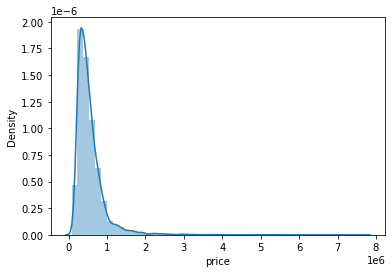

In [107]:
sns.distplot(df['price'])
plt.show()

# Feature Engineering 2

In [123]:
df.corr()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798,0.010128,-0.009872,-0.011708,0.001939
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447,0.003576,-0.008543,-0.010081,-0.014670
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244,-0.009838,-0.002794,-0.001533,-0.008031
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175,-0.026596,0.008332,0.007392,-0.005304
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286,-0.029038,0.012781,0.011810,-0.007246
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557,0.005468,-0.002773,-0.002369,0.000634
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269,-0.022315,0.016699,0.014005,-0.006662
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703,-0.004165,0.007995,0.008132,0.010518
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575,0.001364,-0.006274,-0.005638,0.011174
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406,-0.045589,0.019268,0.021978,-0.004643


In [114]:
df.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,4,10,13
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,4,12,9
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,1,2,25
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,4,12,9
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,1,2,18


In [116]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652,2014.322954,2.524777,6.574423,15.688197
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631,0.467616,1.034210,3.115308,8.635063
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,2014.000000,1.000000,1.000000,1.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000,2014.000000,2.000000,4.000000,8.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000,2014.000000,2.000000,6.000000,16.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,2015.000000,3.000000,9.000000,23.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,2015.000000,4.000000,12.000000,31.000000


In [216]:
df4 = pd.get_dummies(data = df, columns=['bedrooms','bathrooms','floors','waterfront','view','condition','grade','zipcode','year'],prefix_sep='_')

In [217]:
df4

,id,price,sqft_living,sqft_lot,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,quarter,month,day,bedrooms_0,bedrooms_1,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,bedrooms_6,bedrooms_7,bedrooms_8,bedrooms_9,bedrooms_10,bedrooms_11,bedrooms_33,bathrooms_0.0,bathrooms_0.5,bathrooms_0.75,bathrooms_1.0,bathrooms_1.25,bathrooms_1.5,bathrooms_1.75,bathrooms_2.0,bathrooms_2.25,bathrooms_2.5,bathrooms_2.75,bathrooms_3.0,bathrooms_3.25,bathrooms_3.5,bathrooms_3.75,bathrooms_4.0,bathrooms_4.25,bathrooms_4.5,bathrooms_4.75,bathrooms_5.0,bathrooms_5.25,bathrooms_5.5,bathrooms_5.75,bathrooms_6.0,bathrooms_6.25,bathrooms_6.5,bathrooms_6.75,bathrooms_7.5,bathrooms_7.75,bathrooms_8.0,floors_1.0,floors_1.5,floors_2.0,floors_2.5,floors_3.0,floors_3.5,waterfront_0,waterfront_1,view_0,view_1,view_2,view_3,view_4,condition_1,condition_2,condition_3,condition_4,condition_5,grade_1,grade_3,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11,grade_12,grade_13,zipcode_98001,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,year_2014,year_2015
0,7129300520,221900.0,1180,5650,1180,0,1955,0,47.5112,-122.257,1340,5650,4,10,13,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,6414100192,538000.0,2570,7242,2170,400,1951,1991,47.7210,-122.319,1690,7639,4,12,9,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,5631500400,180000.0,770,10000,770,0,1933,0,47.7379,-122.233,2720,8062,1,2,25,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,2487200875,604000.0,1960,5000,1050,910,1965,0,47.5208,-122.393,1360,5000,4,12,9,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
4,1954400510,510000.0,1680,8080,1680,0,1987,0,47.6168,-122.045,1800,7503,1,2,18,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [165]:
Model6 = LinearRegression()

In [218]:
X = df4.drop(columns='price')
y = df4['price']
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size = .20, random_state = 69)

In [219]:
Model6.fit(Xtrain, ytrain)

LinearRegression()

In [220]:
Model6_ytrain_pred = Model6.predict(Xtrain)
Model6_ytest_pred = Model6.predict(Xtest)

In [221]:
hasilfe2 = {
    "Model" : "Features Engineering 2",
    "r2_train" : r2_score(ytrain, Model6_ytrain_pred),
    "MAE_train" : mean_absolute_error(ytrain, Model6_ytrain_pred),
    "MSE_train" : mean_squared_error(ytrain, Model6_ytrain_pred),
    "RMSE_train" : np.sqrt(mean_squared_error(ytrain, Model6_ytrain_pred)),
    "r2_test" : r2_score(ytest, Model6_ytest_pred),
    "MAE_test" : mean_absolute_error(ytest, Model6_ytest_pred),
    "MSE_test" : mean_squared_error(ytest, Model6_ytest_pred),
    "RMSE_test" : np.sqrt(mean_squared_error(ytest, Model6_ytest_pred))
}

In [222]:
df_hasilfe2 = pd.DataFrame(data = hasilfe2.values(), index=hasilfe2.keys()).T
df_hasilfe2

,Model,r2_train,MAE_train,MSE_train,RMSE_train,r2_test,MAE_test,MSE_test,RMSE_test
0,Features Engineering 2,0.840937,85478.537087,20163474507.242802,141998.149661,0.808482,89425.403189,31945839277.202892,178733.990268


In [223]:
pd.concat([df_hasilpolos, df_hasiloutlier, df_hasilfe, df_hasilpoli, df_hasilfe2], keys=['Basic Model', 'Drop Outliers', 'Features Engineering', 'Poli','Features Engineering 2']).sort_values(by=['r2_train', "r2_test"], ascending=False)

Model  r2_train      MAE_train  \
Features Engineering 2 0  Features Engineering 2  0.840937   85478.537087   
Basic Model            0                  LinReg  0.702226  123358.602004   
                       2                   Lasso  0.702226  123357.530222   
                       1                   Ridge  0.702223   123339.59916   
Drop Outliers          0                  LinReg  0.698824   86514.886603   
                       2                   Lasso  0.698824   86514.485371   
                       1                   Ridge  0.698822   86517.321643   
Basic Model            3                    Enet  0.617806  142860.230726   
Features Engineering   0                  LinReg  0.582818  104794.765835   
                       2                   Lasso  0.582818  104794.818127   
                       1                   Ridge  0.582817   104795.06923   
Drop Outliers          3                    Enet  0.556237  109519.383461   
Features Engineering   3                    Enet  0.544736   111151.02065   
Poli                   0                    Poli  0.478805  118030.831123   

                                   MSE_train     RMSE_train   r2_test  \
Features Engineering 2 0  20163474507.242802  141998.149661  0.808482   
Basic Model            0   37747180177.96505  194286.335541  0.696239   
                       2  37747180528.009064  194286.336442  0.696239   
                       1   37747452006.79998  194287.035097  0.696238   
Drop Outliers          0  13045821606.147942  114218.306791  0.698989   
                       2  13045822133.766298    114218.3091   0.69899   
                       1  13045907524.739286  114218.682906  0.698949   
Basic Model            3  48448605741.656197  220110.439874  0.623505   
Features Engineering   0  18070768807.313145  134427.559702  0.570309   
                       2  18070769170.270561  134427.561052   0.57031   
                       1  18070776237.612339  134427.587338  0.570312   
Drop Outliers          3  19222124609.328629  138643.876927  0.552291   
Features Engineering   3  19720310580.729553  140429.023285  0.537904   
Poli                   0  22576188285.038479  150253.746326  0.478758   

                               MAE_test            MSE_test      RMSE_test  
Features Engineering 2 0   89425.403189  31945839277.202892  178733.990268  
Basic Model            0  126403.733733   50668310258.11615  225096.224442  
                       2  126402.506519  50668330816.504135  225096.270108  
                       1  126382.802053  50668461925.939445  225096.561337  
Drop Outliers          0   86959.376297  13180433000.569496  114806.066915  
                       2    86958.67157  13180403061.747377  114805.936527  
                       1   86964.174658  13182157744.870955  114813.578225  
Basic Model            3  147230.741397  62800685748.442741  250600.649936  
Features Engineering   0  106612.794957  18814943762.135857  137167.575477  
                       2  106612.696324  18814896645.176586  137167.403727  
                       1  106612.422556  18814842728.769951  137167.207192  
Drop Outliers          3  110448.624108  19603896473.322407  140013.915285  
Features Engineering   3  112464.255679  20233865569.899601  142245.792802  
Poli                   0  119852.819848  22823728986.737213  151075.242799

# EDA

In [224]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,quarter,month,day
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652,2014.322954,2.524777,6.574423,15.688197
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631,0.467616,1.034210,3.115308,8.635063
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,2014.000000,1.000000,1.000000,1.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000,2014.000000,2.000000,4.000000,8.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000,2014.000000,2.000000,6.000000,16.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,2015.000000,3.000000,9.000000,23.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,2015.000000,4.000000,12.000000,31.000000


In [237]:
df.corr()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406


#### Berdasarkan tabel korelasi, tiga kolom numerical continuous yang paling memiliki korelasi terhadap harga rumah yaitu sqft_living, sqft_above, dan sqft_living15
#### Berdasarkan tabel korelasi, tiga kolom kategorikal yang paling memiliki korelasi terhadap harga rumah yaitu grade, bathrooms, dan bedrooms

In [230]:
df['date'] = pd.to_datetime(df['date'])

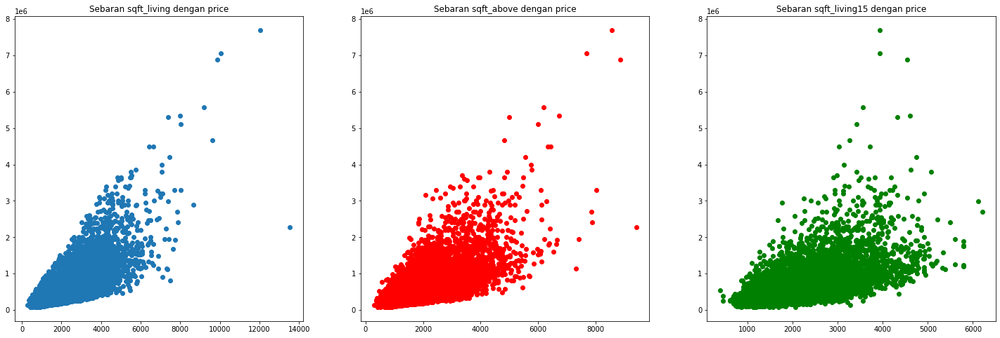

In [277]:
plt.figure(figsize=(25,8))
plt.subplot(1,3,1)
plt.scatter(x=df['sqft_living'], y=df['price'])
plt.title("Sebaran sqft_living dengan price")
plt.subplot(1,3,2)
plt.scatter(x=df['sqft_above'], y=df['price'], color='r')
plt.title("Sebaran sqft_above dengan price")
plt.subplot(1,3,3)
plt.scatter(x=df['sqft_living15'], y=df['price'], color='g')
plt.title("Sebaran sqft_living15 dengan price")
plt.show()

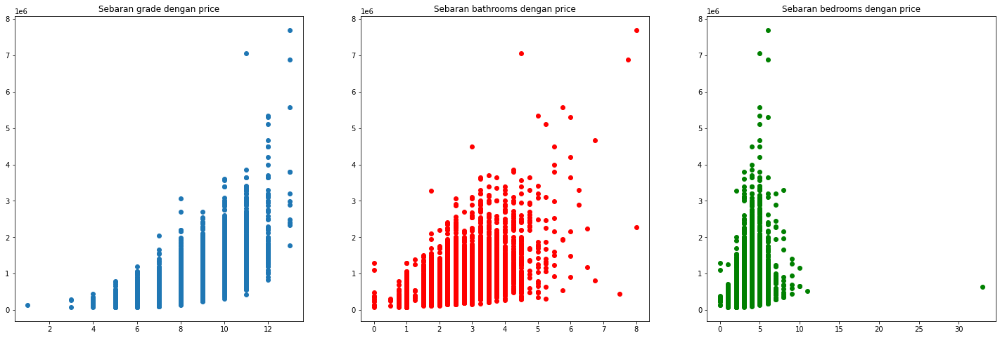

In [281]:
plt.figure(figsize=(25,8))
plt.subplot(1,3,1)
plt.scatter(x=df['grade'], y=df['price'])
plt.title("Sebaran grade dengan price")
plt.subplot(1,3,2)
plt.scatter(x=df['bathrooms'], y=df['price'], color='r')
plt.title("Sebaran bathrooms dengan price")
plt.subplot(1,3,3)
plt.scatter(x=df['bedrooms'], y=df['price'], color='g')
plt.title("Sebaran bedrooms dengan price")
plt.show()

In [248]:
pd.options.display.float_format = '{:.2f}'.format
pd.crosstab(index=df['view'], columns=df['grade'], aggfunc='mean', values=df['price'])

grade,1,3,4,5,6,7,8,9,10,11,12,13
view,,,,,,,,,,,,
0,142000.00,205666.67,200386.54,240733.19,296521.97,396383.36,518761.48,734335.11,975930.79,1291741.36,2028884.65,3073800.00
1,NaN,NaN,326000.00,335000.00,378033.67,540769.95,720077.86,943883.86,1258659.62,1891886.67,3200000.00,NaN
2,NaN,NaN,355000.00,337833.33,411730.71,495007.41,674210.96,875677.54,1113156.37,1726814.41,1861222.31,2866666.67
3,NaN,NaN,NaN,290000.00,408642.14,493347.05,735763.60,987461.03,1377441.19,1626050.00,1585850.00,5341500.00
4,NaN,NaN,NaN,506975.00,577299.33,806516.13,1082035.65,1140211.99,1800670.00,2158005.14,2886979.55,4524333.33


In [257]:
pd.crosstab(index=df['grade'], columns=df['bathrooms'], aggfunc='mean', values=df['price'])

bathrooms,0.00,0.50,0.75,1.00,1.25,1.50,1.75,2.00,2.25,2.50,2.75,3.00,3.25,3.50,3.75,4.00,4.25,4.50,4.75,5.00,5.25,5.50,5.75,6.00,6.25,6.50,6.75,7.50,7.75,8.00
grade,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,142000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,177500.00,NaN,262000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,242714.29,176003.57,NaN,NaN,355000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,109000.00,243100.00,244744.36,NaN,274700.56,264594.44,285315.71,NaN,225000.00,199950.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,264000.00,284490.38,287427.68,397500.00,296334.17,345183.79,341092.19,497500.00,353589.17,392799.20,455750.00,NaN,550000.00,392000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,488487.50,NaN,396785.41,381504.12,318983.33,377041.64,413092.22,420813.06,393086.53,389070.39,480323.50,473397.98,534026.76,474112.50,554037.00,562146.17,560166.67,552249.88,599000.00,492666.67,471750.00,NaN,NaN,NaN,NaN,NaN,NaN,450000.00,NaN,NaN
8,367500.00,312500.00,NaN,571290.43,896000.00,536682.59,538311.03,549243.40,531405.94,510069.36,599411.10,611310.85,578367.21,621917.67,758987.92,940119.83,981278.57,745564.29,682450.00,492500.00,NaN,NaN,540000.00,2150000.00,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,666500.00,528250.00,781707.30,786502.14,667264.29,838028.11,684090.51,822032.72,850131.04,946528.30,862146.49,1197877.94,916298.18,1044070.00,1114266.93,988990.00,NaN,1414500.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,1050000.00,822247.08,943042.31,1054171.00,883958.23,996208.82,1169137.85,1239568.16,1110649.34,1241834.80,1313273.16,1419863.45,1368729.60,2385220.00,1836000.00,1862000.00,1240000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [282]:
pd.crosstab(index=df['view'], columns=df['bathrooms'], aggfunc='mean', values=df['price'])

bathrooms,0.00,0.50,0.75,1.00,1.25,1.50,1.75,2.00,2.25,2.50,2.75,3.00,3.25,3.50,3.75,4.00,4.25,4.50,4.75,5.00,5.25,5.50,5.75,6.00,6.25,6.50,6.75,7.50,7.75,8.00
view,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,375825.00,237375.00,270843.37,341664.63,426408.33,394057.50,436218.06,442406.43,506017.73,526823.73,609512.60,640855.50,837050.56,872883.37,1092298.92,1175049.87,1120173.66,1063680.01,1555832.50,1308717.69,1595187.50,2283000.00,3745000.00,3331000.00,3300000.00,1709445.00,NaN,450000.00,NaN,NaN
1,NaN,NaN,353500.00,469661.45,NaN,553038.10,589479.43,664710.85,708706.06,865639.53,836311.96,787832.14,1113153.40,1042156.07,2303750.00,2225000.00,2195993.33,1959000.00,NaN,NaN,1681000.00,NaN,540000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,737500.00,NaN,423333.33,423709.75,1388000.00,649915.12,589918.54,603320.14,733913.84,752056.46,799547.05,939041.44,1126439.74,992587.85,996912.00,1326948.57,1813258.33,2153318.18,2340000.00,740000.00,1356666.67,2108333.33,NaN,NaN,NaN,NaN,800000.00,NaN,NaN,NaN
3,NaN,NaN,290000.00,528710.59,397500.00,766678.57,616329.84,618896.97,1025745.93,834508.83,867358.46,1029213.24,1415726.52,1130232.69,1564279.17,1363633.33,1662916.67,1388318.18,2315000.00,1621250.00,NaN,2983000.00,NaN,1488000.00,NaN,NaN,NaN,NaN,NaN,7700000.00
4,NaN,NaN,472633.33,585583.33,1247000.00,753428.57,924787.88,1006333.33,1174976.09,1252273.81,1330987.00,1724666.67,1943384.44,1550576.09,1667079.17,1747306.25,2464875.00,2234975.56,3050000.00,3635000.00,5110800.00,4500000.00,1940000.00,3100000.00,2888000.00,NaN,4668000.00,NaN,6885000.00,2280000.00
